# Base Explanation and fashion_mnist
Here 3 datasets will be experimented. Basicaly the provided base notebook I copied base and edited according to outputs that I see and characteristics of datasets.

In base file there were couple different train functions one of them was plotting loss, other printing loss, other generating image etc. As also you know they are mostly same. I printed loses while generating images and did not imported plotting. We can still see fluctuation over epochs in text easily. Also for discrminator I added dropout rate as parameter and did not taken it staticly because in online source (https://machinelearningmastery.com/) it have been tried with 0.2-0.4 range and I also experimented with different values.

I added my best cifar and fashion_mnist generated gif directly to assginment but also added gifs that created while experimenting with different settings. These experiments include putting different layers, using different dropout rates, using different epochs and using different noice dimensions. Changing layer structure, epoch and noice dimension were most effective ones in terms of improvement of model.

fashion_mnist, cifar10 and cifar100 is tested with multiple epoch and noise dimensions. In fashion_mnist with 128 noise dimension, 100 epoch and 0.2 dropuout in discrimator did good for generating new clothes that gif is added. Below you can see the code to generate best fashion_mnist generation.


<ipython-input-10-7a2b6e86cfb2>:192: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-10-7a2b6e86cfb2>:194: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


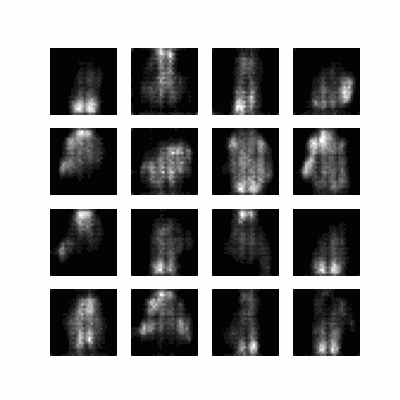

In [10]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os
import time
!pip install livelossplot --quiet

from livelossplot import PlotLosses
import glob
import imageio
from IPython import display
from IPython.display import Image

def build_generator(noise_dim=100):
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(noise_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())


    model.add(layers.Reshape((7, 7, 256)))
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))


    model.add(layers.Conv2DTranspose(1, (3, 3), strides=(1, 1),padding='same', activation='tanh',use_bias=False))

    return model

def build_discriminator(drop_out=0.3):
    model = tf.keras.Sequential()
    model.add((layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1])))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(drop_out))

    model.add((layers.Conv2D(128, (3,3), strides=(2, 2), padding='same')))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(drop_out))
    model.add((layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same')))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(drop_out))

    model.add(layers.Flatten())

    model.add(layers.Dense(1))
    return model
discriminator = build_discriminator(drop_out=0.2)
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)
generator_optimizer = tf.keras.optimizers.Adam(1e-4,beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4,beta_1=0.5)


@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss
def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0], cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()



def train_with_images(dataset, epochs):
  epoch_gen_loss = tf.keras.metrics.Mean(name="epoch_gen_loss")
  epoch_disc_loss = tf.keras.metrics.Mean(name="epoch_disc_loss")
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      gen_loss, disc_loss = train_step(image_batch)
      epoch_gen_loss.update_state(gen_loss)
      epoch_disc_loss.update_state(disc_loss)

    mean_gen_loss = epoch_gen_loss.result()
    mean_disc_loss = epoch_disc_loss.result()

    display.clear_output(wait=True)
    generate_and_save_images(generator, epoch + 1, seed)
    print('Epoch {} in {} sec, gen_loss = {}, disc_loss = {}'.format(epoch + 1, time.time()-start, mean_gen_loss, mean_disc_loss))

  display.clear_output(wait=True)
  generate_and_save_images(generator, epochs, seed)



(train_images, train_labels), (_, _) = tf.keras.datasets.fashion_mnist.load_data()
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]
BATCH_SIZE = 256
NOISE_DIM = 128
generator = build_generator(NOISE_DIM)
generator.summary()

NUM_EXAMPLES_TO_GENERATE = 16
seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])

DATASET_SIZE = 60000
EPOCHS = 100
EPOCHS_BETWEEN_CHECKPOINTS = 10
anim_file = 'gan_anim.gif'
train_dataset = tf.data.Dataset.from_tensor_slices(train_images[:DATASET_SIZE]).shuffle(DATASET_SIZE).batch(BATCH_SIZE)

train_with_images(train_dataset, EPOCHS)

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)
Image(open(anim_file, 'rb').read())

# Cifar10 and 100

Key differences with what we have done above and here is coloring and complexity of pictures. Mnist had 1 channel images. Meantime cifar have 3 channel which is rgb. Also complexity of labels are changing. Due to that flattening process and discrimantor/generator changed a bit. As picture sizes, mnist is 28x28 and cifar is 32x32. All of these changes adapted below. Code is mostly copy pasted from above but with changing structure a bit.

As per the results, most of the generations while experimenting parameters are not good. They seemed as just random drawings. But the result code below is able to produce reasonable pictures. Its with 300 epoch, 0.3 dropout, 256 noice dimension and change of layer structure. Also same code experimented with cifar100.

Best gif can be found within the submission all other generations can be found in seperate folder in submission.

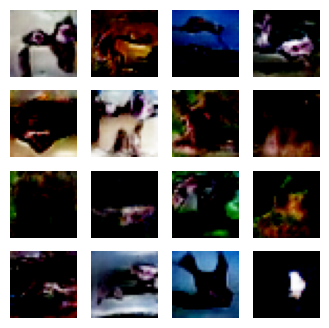

<ipython-input-6-8f2476b4ad50>:193: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-6-8f2476b4ad50>:195: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


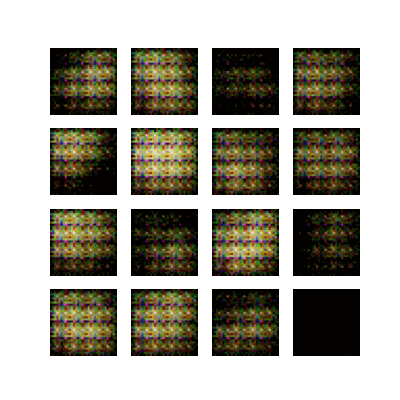

In [6]:

def build_generator(noise_dim=100):
    model = tf.keras.Sequential()
    model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(noise_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((4, 4, 256)))

    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # one more layer added
    model.add(layers.Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (3, 3), strides=(1, 1),padding='same', activation='tanh',use_bias=False))

    return model

def build_discriminator(drop_out=0.3):
    model = tf.keras.Sequential()
    model.add((layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same',
                                     input_shape=[32, 32, 3])))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(drop_out))

    model.add((layers.Conv2D(128, (3,3), strides=(2, 2), padding='same')))
    model.add(layers.LeakyReLU())

    model.add(layers.Dropout(drop_out))

    model.add((layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same')))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(drop_out))

    model.add(layers.Flatten())

    model.add(layers.Dense(1))
    return model
discriminator = build_discriminator()
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)
generator_optimizer = tf.keras.optimizers.Adam(1e-4,beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4,beta_1=0.5)


@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i])
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()



def train_with_images(dataset, epochs):
  epoch_gen_loss = tf.keras.metrics.Mean(name="epoch_gen_loss")
  epoch_disc_loss = tf.keras.metrics.Mean(name="epoch_disc_loss")
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      gen_loss, disc_loss = train_step(image_batch)
      epoch_gen_loss.update_state(gen_loss)
      epoch_disc_loss.update_state(disc_loss)

    mean_gen_loss = epoch_gen_loss.result()
    mean_disc_loss = epoch_disc_loss.result()

    display.clear_output(wait=True)
    generate_and_save_images(generator, epoch + 1, seed)
    print('Epoch {} in {} sec, gen_loss = {}, disc_loss = {}'.format(epoch + 1, time.time()-start, mean_gen_loss, mean_disc_loss))

  display.clear_output(wait=True)
  generate_and_save_images(generator, epochs, seed)



(train_images, train_labels), (_, _) = tf.keras.datasets.cifar10.load_data()
train_images = train_images.reshape(train_images.shape[0], 32, 32, 3).astype('float32')

train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]
BATCH_SIZE = 256
NOISE_DIM = 256
generator = build_generator(NOISE_DIM)
generator.summary()

NUM_EXAMPLES_TO_GENERATE = 16
seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])
DATASET_SIZE = 60000
EPOCHS = 300
EPOCHS_BETWEEN_CHECKPOINTS = 10
anim_file = 'gan_anim.gif'
train_dataset = tf.data.Dataset.from_tensor_slices(train_images[:DATASET_SIZE]).shuffle(DATASET_SIZE).batch(BATCH_SIZE)

train_with_images(train_dataset, EPOCHS)

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)
Image(open(anim_file, 'rb').read())

In cifar10 dataset following source is also used to improve quality of pictures. Citing it below.

https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/
